# Catering establishments market in Moscow

Investors from the 'Shut Up and Take My Money' fund have decided to try their hand in a new area and open a catering establishment in Moscow. The clients do not yet know what kind of place it will be: a cafe, restaurant, pizzeria, pub, or bar — nor what the location, menu, and prices will be.

To begin with, they are asking you — as an analyst — to prepare a study of the Moscow market, identify interesting features, and present the results, which will later help in choosing a suitable location for the investors.

Try to make the presentation informative and concise. Its structure and design greatly influence how readers perceive your research. You may choose the tools (matplotlib, seaborn, and others) and types of visualizations yourself.

You have access to a dataset of catering establishments in Moscow, compiled based on data from Yandex Maps and Yandex Business services as of summer 2022. The information posted on Yandex Business may have been added by users or found in publicly available sources. It is for reference purposes only.

## Data description

Structure of moscow_places.csv

- name — name of the establishment;
- address — address of the establishment;
- category — category of the establishment, e.g., "cafe", "pizzeria", or "coffee shop";
- hours — information about days and hours of operation;
- lat — latitude of the geographic point where the establishment is located;
- lng — longitude of the geographic point where the establishment is located;
- rating — establishment rating based on user reviews on Yandex Maps (highest rating is 5.0);
- price — price category of the establishment, e.g., "medium", "below average", "above average", etc.;
- avg_bill — a string that stores the average order cost as a range, for example:

  - "Average bill: 1000–1500 ₽";
  - "Price of a cup of cappuccino: 130–220 ₽";
  - "Price of a glass of beer: 400–600 ₽";
   and so on;
 - middle_avg_bill — a numeric value representing the estimated average bill, provided only for values in the avg_bill column that begin
 with the substring "Average bill":
   - If the string specifies a price range of two values, the column contains the median of those two values.
   - If the string specifies a single number (a price without a range), the column contains that number.
   - If there is no value or it does not begin with the substring "Average bill", then nothing is entered into the column.
- middle_coffee_cup — a numeric value representing the estimated price of one cup of cappuccino, provided only for values in the avg_bill column that begin with the substring "Price of a cup of cappuccino":
  - If the string specifies a price range of two values, the column contains the median of those two values.
  - If the string specifies a single number (a price without a range), the column contains that number.
  - If there is no value or it does not begin with the substring "Price of a cup of cappuccino", then nothing is entered into the column.
- chain — a number expressed as 0 or 1, indicating whether the establishment is part of a chain (errors may occur for small chains):
  - 0 — the establishment is not a chain
  - 1 — the establishment is a chain
- district — the administrative district where the establishment is located, e.g., Central Administrative District;
- seats — the number of seats.

## Table of Contents
1. [Data Opening](#start)
    * [1.1. Exploring General Information](#learn)
    * [1.2. How many establishments are represented?](#count)
    * [1.3. Examining Data Types in Columns](#type)
    * [1.4. Conclusion](#conclusion1)
2. [Data Preprocessing](#preprocessing)
    * [2.1. Handling Duplicates](#duplicates) 
    * [2.2. Handling Missing Values](#null)
    * [2.3. Adding Columns](#create)
    * [2.4. Conclusion](#conclusion2)
3. [Data Analysis](#analisys)
    * [3.1. Analyzing the Number of Catering Establishments by Category](#category) 
    * [3.2. Analyzing the Number of Seats in Establishments by Category](#seats)
    * [3.3. Analyzing the Ratio of Chain to Non-Chain Establishments in the Dataset](#chain)
    * [3.4. Which Categories of Establishments Are More Often Chain Establishments?](#chaincategory)
    * [3.5. Which Administrative Districts of Moscow Are Present in the Dataset?](#top)
    * [3.6. Analyzing the Top 15 Popular Chains in Moscow](#dist)
    * [3.7. Analyzing the Distribution of Average Ratings by Establishment Category](#rating)
    * [3.8. Creating a Background Cartogram (Choropleth) with the Average Rating of Establishments in Each District](#сhoropleth)
    * [3.9. Displaying All Dataset Establishments on a Map Using Clusters](#cluster)
    * [3.10. Top 15 Streets by Number of Establishments](#top)
    * [3.11. Analyzing Streets with Only One Catering Establishment](#one_place)
    * [3.12. Analyzing Average Bill Values for Each District](#mean_bill)
    * [3.13. Conclusion](#conclusion3)
4. [Opening a Coffee Shop](#open)
    * [4.1. Analyzing the Number of Coffee Shops by District](#caf) 
    * [4.2. Analyzing 24-Hour Coffee Shops](#hours_caf)
    * [4.3. Analyzing the Average Rating of Coffee Shops by District](#rating_caf)
    * [4.4. Analyzing the Price of a Cup of Cappuccino](#price)
    * [4.5. Top 15 Popular Coffee Shop Chains in Moscow](#top_caf)
    * [4.6. Conclusion](#conclusion4)
5. [Overall Conclusion](#conclusion_main)
6. [Preparing a Presentation](#present)

In [1]:
#импортируем необходимые библиотеки 
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings; warnings.filterwarnings(action='ignore')
from plotly import graph_objects as go
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json
from pandas.io.json import json_normalize
import webbrowser

### 1. Data Opening
<a id="start"></a> 

In [2]:
try: 
    places=pd.read_csv('moscow_places.csv', sep=',')
except:
    places=pd.read_csv('/datasets/moscow_places.csv', sep=',')

In [3]:
places.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


#### 1.1. Exploring General Information
<a id="learn"></a>

In [4]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


#### 1.2. How many establishments are represented?
<a id="count"></a>

In [5]:
print('Всего заведений', places['name'].count())

Всего заведений 8406


#### 1.3. Examining Data Types in Columns
<a id="type"></a>

Presented data types: float, object, int. There are missing values in the columns, which we will handle later. We cannot convert columns to int where possible (e.g., the seats column) because there are NaN values.

#### 1.4. Conclusion
<a id="conclusion1"></a> 

We have examined the general information about the dataframe. Presented data types: float, object, int. There are missing values in the columns, which we will handle later. We cannot convert columns to int where possible (e.g., the seats column) because there are NaN values.

### 2. Data Preprocessing
<a id="preprocessing"></a> 

#### 2.1. Handling Duplicates
<a id="duplicates"></a> 

In [6]:
print('Количество явных дубликатов:', places.duplicated().sum())

Количество явных дубликатов: 0


In [7]:
print('Проверка на неявные дубликаты столбец "category"')
print(places['category'].unique())

Проверка на неявные дубликаты столбец "category"
['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


In [8]:
print('Количество уникальных заведений:')
places['name'].nunique()

Количество уникальных заведений:


5614

Implicit duplicates

- Krokha Kartoshka, Krokha kartoshka
- Yandex Lavka, Yandex.Lavka
- Chaykhana Halal, Chaykhana halal
- Khleb Nasushchny, Khleb nasushchny
- Pravda Coffee, Pravda coffee...

We will remove implicit duplicates by converting the names to lowercase.

In [9]:
places['name'] = places['name'].str.lower().replace('.', ' ')
print(f'После приведения названий к нижнему регистру стало {places.name.nunique()} названий')

После приведения названий к нижнему регистру стало 5512 названий


In [10]:
print('Количество явных дубликатов:', places.duplicated().sum())

Количество явных дубликатов: 0


#### 2.2. Handling Missing Values
<a id="null"></a> 

In [11]:
print('Наличие пропусков в столбах в %')
round(places.isnull().sum ()/ len(places)* 100,1)

Наличие пропусков в столбах в %


name                  0.0
category              0.0
address               0.0
district              0.0
hours                 6.4
lat                   0.0
lng                   0.0
rating                0.0
price                60.6
avg_bill             54.6
middle_avg_bill      62.5
middle_coffee_cup    93.6
chain                 0.0
seats                43.0
dtype: float64

In some columns, missing values exceed 50% (price, avg_bill, middle_avg_bill, middle_coffee_cup). We cannot delete them because a large amount of data would be lost, so we leave them as is.

#### 2.3. Adding Columns 
<a id="create"></a> 

We created a 'street' column with street names from the address column. We created an 'is_24/7' column indicating that the establishment is open daily and 24/7.

In [12]:
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

places["street"] = places["address"].str.extract(str_pat)

In [13]:
places['is_24/7']=places['hours'].str.contains('ежедневно, круглосуточно')

In [14]:
places.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
5,sergio pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,Ижорская улица,False
6,огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица,False
7,mr. уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица,False
8,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
9,готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица,False


#### 2.4. Conclusion
<a id="conclusion2"></a> 

We handled implicit duplicates. We left the missing values in the columns because they constitute a large portion of the data; removing them would distort the information. We added the 'street' and 'is_24/7' columns.

### 3. Data Analysis
<a id="analisys"></a> 

#### 3.1. Analyzing the Number of Catering Establishments by Category
<a id="category"></a> 

In [15]:
print('Категории заведений:')
places['category'].unique()

Категории заведений:


array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [16]:
cat=places.groupby('category')['name'].count().reset_index().sort_values(by='name', ascending=False)
fig = px.bar(cat,
             x='category', 
             y='name', 
             text='name' 
            )
# оформляем график
fig.update_layout(title='Распределение количества заведений по категориям',
                   yaxis_title='Количество заведений',
                   xaxis_title='Категория')
fig.show() # выводим график

In [17]:
fig = px.pie(cat, values='name', names='category', title='Процентное соотношение количества заведений по категориям')
fig.show()

Top 3 categories by number of catering establishments:

1. Cafe — 28.3%
2. Restaurant — 24.3%
3. Coffee shop — 16.8%

The remaining categories do not exceed 10%


#### 3.2 Analyzing the Number of Seats in Establishments by Category
<a id="seats"></a> 

In [18]:
seats=places.groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False)
fig = px.bar(seats,
             x='category', 
             y='seats', 
             text='seats' 
            )
# оформляем график
fig.update_layout(title='Медианное распредление количества посадачных мест по категориям',
                   yaxis_title='Количество мест',
                   xaxis_title='Категория')
fig.show() # выводим график

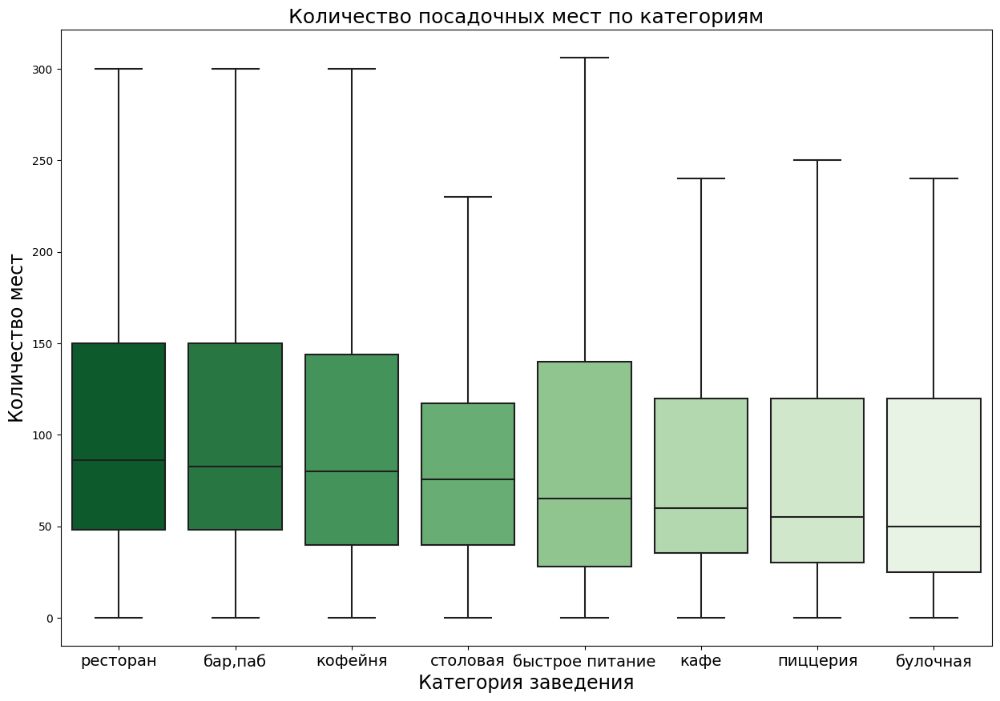

In [19]:
plt.figure(figsize=(15, 10))
box_order = places.groupby('category')['seats'].median().sort_values(ascending=False).index # сортируем по медиане
ax = sns.boxplot(x='category', y='seats', data=places, order=box_order, palette= 'Greens_r', showfliers=False) 
ax.set_ylabel('Количество мест', fontsize=17)
ax.set_xlabel('Категория заведения', fontsize=17)
plt.xticks(fontsize=14)
ax.set_title('Количество посадочных мест по категориям', fontsize=18);

The highest median numbers of seats are in restaurants, bars, pubs, and coffee shops (80 or more). The lowest is in bakeries — 50. This distribution is due to the time spent in the establishments. Establishments in some categories (e.g., bakeries, pizzerias) are designed for takeout, so there is no need for a large number of seats. Outliers are also observed in the data.

#### 3.3. Analyzing the ratio of chain to non-chain establishments in the dataset
<a id="chain"></a> 

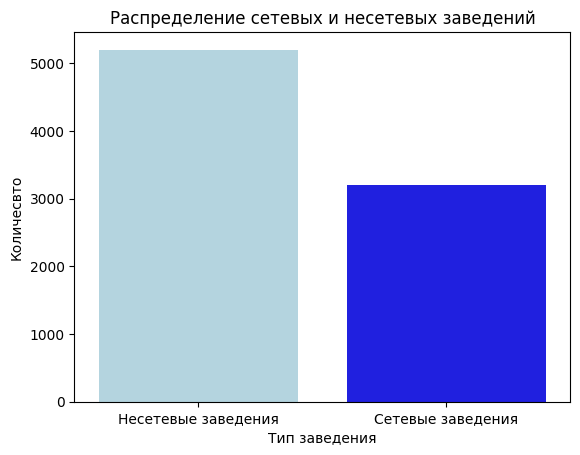

In [20]:
chain=places.groupby('chain')['name'].count().reset_index()
chain['chain']=['Несетевые заведения' , 'Сетевые заведения']
ax = sns.barplot(x='chain',
            y='name',
            data=chain,
            palette=['lightblue', 'blue']
)

ax.set_title('Распределение сетевых и несетевых заведений')
ax.set(xlabel='Тип заведения', ylabel='Количесвто');

In [21]:
fig = px.pie(chain, values='name', names='chain', title='Процентное соотношение количества сетевых и несетевых заведений')
fig.show()

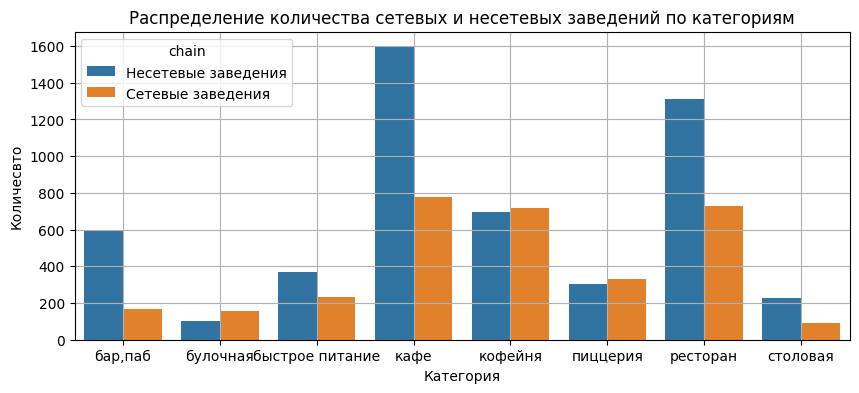

In [22]:
chain_c=places.groupby(['category', 'chain'])[['name']].count().reset_index()
chain_c=chain_c.replace(0, 'Несетевые заведения' )
chain_c=chain_c.replace(1, 'Сетевые заведения' )
plt.figure(figsize=(10, 4))
sns.barplot(x='category', y='name', data=chain_c, hue='chain')
plt.title('Распределение количества сетевых и несетевых заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количесвто')
# выбираем положение легенды и указываем размер шрифта
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

The share of non-chain establishments is 61.9%, while chain establishments account for 38.1%.
The share of non-chain establishments in the cafe and restaurant categories is larger than that of chain ones. For coffee shops, chain establishments are more numerous, but the difference in quantity is small.

#### 3.4. Which categories of establishments are more often chain establishments?
<a id="chaincategory"></a>   

In [23]:
chain_category=places[places['chain']==1]
chain_cat=chain_category.groupby('category')['name'].count().reset_index().sort_values(by='name', ascending=False)
fig = px.bar(chain_cat,
             x='category', 
             y='name', 
             text='name' 
            )
# оформляем график
fig.update_layout(title='Распредление количества сетевых заведений по категориям',
                   yaxis_title='Количество заведений',
                   xaxis_title='Категория')
fig.show() # выводим график

In [24]:
d=places.groupby(by='category')['name'].count().reset_index()
chain_cat['%']=(chain_cat['name']/d['name']*100).round(1)
fig = px.bar(chain_cat.sort_values(by='%',ascending=False),
             x='category', 
             y='%', 
             text='%' 
            )
# оформляем график
fig.update_layout(title='Процент сетевых заведений от общего количества заведений каждого типа.',
                   yaxis_title='Количество заведений',
                   xaxis_title='Категория')
fig.show() # выводим график

In [25]:
fig = px.pie(chain_cat, values='name', names='category', title='Процентное соотношение количества сетевых заведений по категориям')
fig.show()

Top 3 categories by number of chain establishments:

- Cafe — 24.3%
- Restaurant — 22.8%
- Coffee shop — 22.5%

The fewest chain establishments are in canteens (2.75%)

#### 3.5. Top 15 Popular Chains in Moscow
<a id="top"></a>   

In [26]:
top=chain_category.groupby('name')['address'].count().reset_index()
top=top.sort_values(by='address', ascending=False).head(15)
fig = px.bar(top,
             x='name', 
             y='address', 
             text='address' 
            )
# оформляем график
fig.update_layout(title='Топ-15 популярных сетей в Москве',
                   yaxis_title='Количество',
                   xaxis_title='Название сетей заведений')
fig.show() # выводим график

In [27]:
name_chain=top['name'].to_list()
tоp_15 = places.query('name in @name_chain').groupby(['category'], as_index=False)[['address']].count()
fig = px.bar(tоp_15.sort_values(by='address',ascending=False),
             x='category', 
             y='address', 
             text='address' 
            )
# оформляем график
fig.update_layout(title='Распредление топ-15 сетей по категориям',
                   yaxis_title='Количество',
                   xaxis_title='Категории')
fig.show() # в

The leading position is held by the chain Shokoladnitsa (120 establishments). Domino's Pizza, Dodo Pizza, Yandex.Lavka, and One Price Coffee are approximately in equal shares in the range of 71–76. The majority of chains are in the categories of coffee shops, restaurants, and pizzerias. People value fast service, walkable accessibility from work or home, and affordable pricing, so the number of such establishments is determined by consumer demand.

#### 3.6. Which administrative districts of Moscow are present in the dataset?
<a id="dist"></a> 

In [28]:
places['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

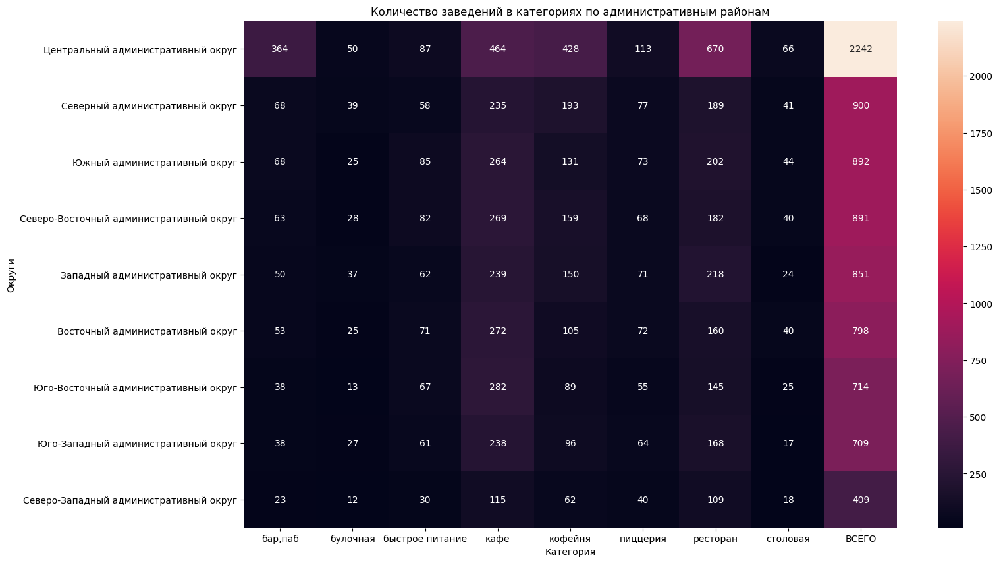

In [29]:
dist = places.pivot_table(index = 'district',columns='category',values='address',aggfunc=['count'])
dist.columns = dist.columns.get_level_values(1)
dist.index.name = None
dist['ВСЕГО'] = dist.sum(axis=1)
dist=dist.sort_values(by='ВСЕГО', ascending=False)
plt.figure(figsize=(16,10))
sns.heatmap(dist, annot=True, fmt='.4g')
plt.title('Количество заведений в категориях по административным районам')
plt.xlabel('Категория')
plt.ylabel('Округи')
plt.show()

The largest number of establishments is in the Central Administrative District, followed by the Northern and Southern Administrative Districts. The smallest number of establishments is in the Northwestern Administrative District. The leading categories are: cafe, coffee shop, restaurant, followed by bar and pub.

#### 3.7. Analyzing the Distribution of Average Ratings by Establishment Category
<a id="rating"></a> 

In [30]:
rating=places.groupby('category')['rating'].mean().reset_index().round(1).sort_values(by='rating')
fig = px.bar(rating,
             x='category', 
             y='rating', 
             text='rating' 
            )
# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   yaxis_title='Рейтинг',
                   xaxis_title='Категории')
fig.update_yaxes(range=[3.5, 4.5])
fig.show() # выводим график

Bars and pubs have the highest rating — 4.4. Next, with a rating of 4.3, are the categories: restaurant, coffee shop, pizzeria, bakery. Cafe and fast food have a rating of 4.1.

#### 3.8. Creating a Background Cartogram (Choropleth) with the Average Rating of Establishments in Each District
<a id="сhoropleth"></a> 

In [31]:

score_dist = places.groupby('district',as_index=False)['rating'].mean().round(1)


# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=score_dist,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

The highest rating among establishments is in the Central Administrative District (4.4), and the lowest rating is in the Southeastern Administrative District and the Northeastern Administrative District (4.1).

#### 3.9. Displaying all dataset establishments on a map using clusters
<a id="cluster"></a> 

In [32]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
k= Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(k)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
k

The largest number of establishments is in the Central Administrative District, Southern Administrative District, and Northern Administrative District.

#### 3.10. Top 15 Streets by Number of Establishments
<a id="top"></a> 

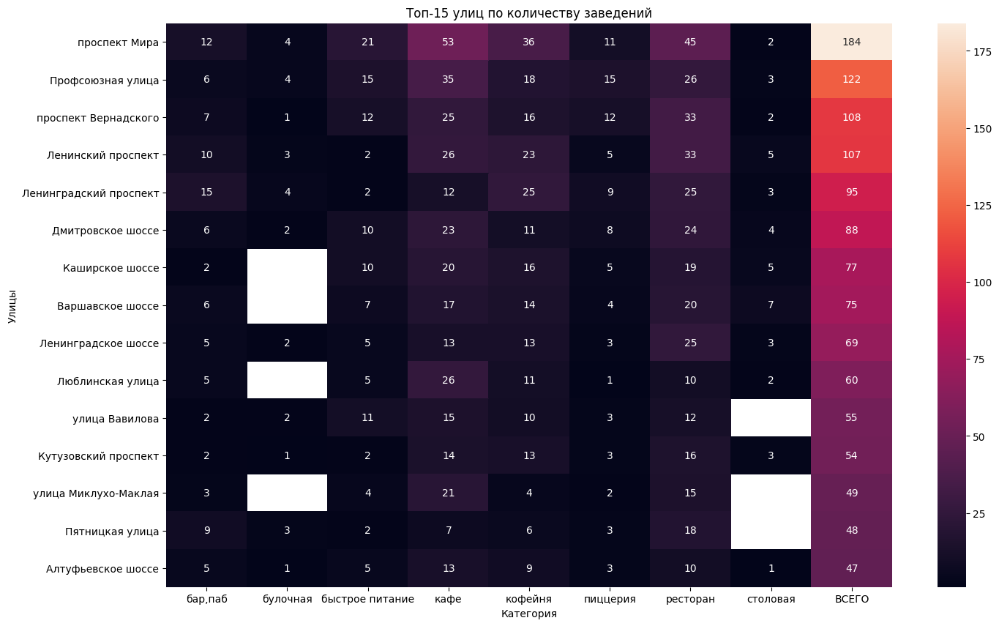

In [33]:
street = places.pivot_table(index = 'street',columns='category',values='name',aggfunc=['count'])
street.columns = street.columns.get_level_values(1)
street.index.name = None
street['ВСЕГО'] = street.sum(axis=1)
plt.figure(figsize=(16,10))
sns.heatmap(street.sort_values(by='ВСЕГО', ascending=False).head(15), annot=True, fmt='.4g')
plt.title('Топ-15 улиц по количеству заведений')
plt.xlabel('Категория')
plt.ylabel('Улицы')
plt.show()

The largest number of establishments is on the following streets: Mira Avenue, Profsoyuznaya Street, and Vernadsky Avenue. The leading categories on these streets are: cafe, coffee shop, restaurant. The smallest number of establishments is on Altufevskoye Highway.

#### 3.11. Analyzing Streets with Only One Catering Establishment
<a id="one_place"></a> 

In [34]:
one_o=street[street['ВСЕГО'] == 1].reset_index()
temp_list = one_o['index'].to_list()
single_st = places.query('street in @temp_list').groupby(['category'], as_index=False)[['address']].count()
fig = px.bar(single_st.sort_values(by='address', ascending=False),
             x='category', 
             y='address', 
             text='address' 
            )
# оформляем график
fig.update_layout(title='Распредление количества заведений, являющихся единственными на улице, по категорям',
                   yaxis_title='Количество',
                   xaxis_title='Категория')
fig.show() # выводим график

In [35]:
h = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
one_pla =places.query('street in @temp_list').groupby('district')['name'].count().reset_index()
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=one_pla,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Распредление количества заведений, являющихся единственными на улице, по районам',
).add_to(h)

# выводим карту
h

Больше всего улиц с одним заведением в Центральном административном округе. 
В названиях многих улиц присутствуют слова "проезд","переулок", что говорит о том, что это короткие улицы. Такие заведения могут находится в промзонах.


#### 3.12. Изучения значения средних чеков для каждого района.
<a id="mean_bill"></a> 

In [36]:
k= Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
middle_avg_bill = places.groupby('district',as_index=False)['middle_avg_bill'].median().round(1)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный значения чеков заведений по районам',
).add_to(k)

# выводим карту
k

The highest average bill is in the Central and Western Administrative Districts — 1,000 rubles. Low bills are in the Southern, Eastern, and Northeastern Administrative Districts — 450 rubles. This distribution may be due to the prestige of the district.

#### 3.13. Conclusion
<a id="conclusion3"></a> 


<ol> 
    <li>Top 3 categories by number of catering establishments:
        <ul>
            <li>Cafe — 28.3%</li>
            <li>Restaurant — 24.3%</li>
            <li>Coffee shop — 16.8%</li>
        </ul>The remaining categories do not exceed 10%.</li>
    <li>Number of seats in establishments by category:
        <ul><li>The highest median numbers of seats are in restaurants, bars, pubs, and coffee shops (80 or more). The lowest is in bakeries — 50. This distribution is due to the time spent in the establishments. Establishments in some categories (e.g., bakeries, pizzerias) are designed for takeout, so there is no need for a large number of seats. Outliers are also observed in the data.</li></ul></li>
    <li>Ratio of chain to non-chain establishments in the dataset:
        <ul><li>The share of non-chain establishments is 61.9%, while chain establishments account for 38.1%. The share of non-chain establishments in the cafe and restaurant categories is larger than that of chain ones. For coffee shops, chain establishments are more numerous, but the difference in quantity is small.</li></ul>
    </li>
     <li>Top 3 categories by number of chain establishments:
        <ul>
            <li>Cafe — 24.3%</li>
            <li>Restaurant — 22.8%</li>
            <li>Coffee shop — 22.5%</li>
        </ul>The fewest chain establishments are in canteens (2.75%).</li>
    <li>Popular establishment chains:
        <ul><li>The leading position is held by the chain Shokoladnitsa (120 establishments). Domino's Pizza, Dodo Pizza, Yandex.Lavka, and One Price Coffee are approximately in equal shares in the range of 71–76. These chains can be classified as fast food, coffee shops, pizzerias, and restaurants. People value fast service, walkable accessibility from work or home, and affordable pricing, so the number of such establishments is determined by consumer demand.</li></ul>
    <li>Number of establishments by category and administrative district:
        <ul><li>The largest number of establishments is in the Central Administrative District, followed by the Northern and Southern Administrative Districts. The smallest number of establishments is in the Northwestern Administrative District. The leading categories are: cafe, coffee shop, restaurant, followed by bar and pub.</li></ul>
    <li>Distribution of average ratings by establishment category:
        <ul><li>Bars and pubs have the highest rating — 4.4. Next, with a rating of 4.3, are the categories: restaurant, coffee shop, pizzeria, bakery. Cafe and fast food have a rating of 4.1.</li></ul>
    <li>Distribution of average ratings by district:
        <ul><li>The highest rating among establishments is in the Central Administrative District (4.4), and the lowest rating is in the Southeastern Administrative District and the Northeastern Administrative District (4.1).</li></ul>
    </li>
    <li>Top 3 streets by number of establishments:
        <ul><li>The largest number of establishments is on the following streets: Mira Avenue, Profsoyuznaya Street, and Vernadsky Avenue. The leading categories on these streets are: cafe, coffee shop, restaurant. The smallest number of establishments is on Altufevskoye Highway.</li></ul>
    <li>Streets with only one catering establishment:
        <ul><li>The largest number of streets with a single establishment is in the Central Administrative District. Many street names include words like "proezd" (drive) or "perculok" (lane), indicating that these are short streets. Such establishments may be located in industrial zones.</li></ul>
    <li>Average bill values for each district:
        <ul><li>The highest average bill is in the Central and Western Administrative Districts — 1,000 rubles. Low bills are in the Southern, Southeastern, and Northeastern Administrative Districts — 450 rubles. This distribution may be due to the prestige of the district.</li></ul>
    </li>
</ol>

### 4. Opening a Coffee Shop
<a id="open"></a> 

#### 4.1. Analyzing the Number of Coffee Shops by District
<a id="caf"></a> 

In [37]:
print('Всего кофеен-', places[places['category']=='кофейня']['name'].count())

Всего кофеен- 1413


In [38]:
caf=places[places['category']=='кофейня']
l=Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
d = caf.groupby('district')['name'].count().reset_index()
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=d,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Распределение количества кофеин по районам Москвы',
).add_to(l)

# выводим карту
l

The largest number of coffee shops is in the Central Administrative District — 428. In second place is the Northern Administrative District — 367.

#### 4.2. Analyzing 24-Hour Coffee Shops
<a id="hours_caf"></a> 


In [39]:
print('Количесвто круглосотучных кофейн-',caf[caf['is_24/7']==True]['name'].count())

Количесвто круглосотучных кофейн- 59


In [40]:
f= Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
dt=caf[caf['is_24/7']==True]
dt = dt.groupby('district')['name'].count().reset_index()
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dt,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Распределение количества круглосотучных кофейн по районам Москвы',
).add_to(f)

# выводим карту
f

The largest number of 24-hour coffee shops is in the Central Administrative District.

#### 4.3. Analyzing the Average Rating of Coffee Shops by District
<a id="rating_caf"></a> 

In [41]:
d = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
dt_r=caf.groupby('district')['rating'].mean().reset_index()
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dt_r,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофейн по районам',
).add_to(d)

# выводим карту
d

The highest rating of coffee shops is in the Central Administrative District (4.4). The lowest ratings are in the Southeastern and Northeastern Administrative Districts (4.1).

#### 4.4. Analyzing the Price of a Cup of Cappuccino
<a id="price"></a> 

In [42]:
d = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
m=caf.groupby('district')['middle_coffee_cup'].mean().reset_index()
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=m,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя стоимость кружки капучино по районам',
).add_to(d)

# выводим карту
d

The highest average price (190 rubles) for a cup of cappuccino is in the Central, Western, and Southwestern Administrative Districts. The lowest price (around 150 rubles) is in the Southeastern Administrative District.

#### 4.5. Top 15 Popular Coffee Shop Chains in Moscow
<a id="top_caf"></a> 

In [43]:
top_сaf=caf.groupby('name')['address'].count().reset_index()
top_сaf=top_сaf.sort_values(by='address', ascending=False).head(15)
fig = px.bar(top_сaf,
             x='name', 
             y='address', 
             text='address' 
            )
# оформляем график
fig.update_layout(title='Топ-15 популярных сети кофейн в Москве',
                   yaxis_title='Количество',
                   xaxis_title='Название сетей заведений')
fig.show() # выводим график

<ul>Top 3 popular coffee shop chains in Moscow:
            <li>Shokoladnitsa — 119</li>
            <li>One Price Coffee — 72, average price of a cup 277 rubles</li>
            <li>Cofix — 65</li>
</ul>

#### 4.6. Conclusion
<a id="conclusion4"></a> 


<ol>
    <li>Total number of coffee shops: 1,413</li>
    <li>The largest number of coffee shops is in the Central Administrative District — 428. In second place is the Northern Administrative District — 367.</li>
    <li>The number of 24-hour coffee shops is 59, mostly located in the Central Administrative District. They are not particularly widespread; most coffee shops operate from morning until late evening.</li>
    <li>The highest rating of coffee shops is in the Central Administrative District (4.4). The lowest ratings are in the Southeastern and Northeastern Administrative Districts (4.1).</li>
    <li>The highest average price (190 rubles) for a cup of cappuccino is in the Central, Western, and Southwestern Administrative Districts. The lowest price (around 150 rubles) is in the Southeastern Administrative District.</li>
  <li>Top 3 popular coffee shop chains in Moscow:
        <ul>
            <li>Shokoladnitsa — 119</li>
            <li>One Price Coffee — 72</li>
            <li>Cofix — 65</li>
        </ul>
</li>     
</ol>

When opening a new coffee shop, it is worth paying attention to the location, the number of similar establishments, and the average price of a cup.

There are chains with a large number of establishments and an average bill of 150–200 rubles per cup. One should not open an establishment near a large number of well-known coffee shop chains, as competing with such establishments in the early stages would be difficult.

It is worth considering the Northeastern Administrative District, as the number of establishments there is average, the rating of coffee shops is the lowest (4.2), and the price of a cup is around 180 rubles. Opening a new coffee shop in this district could attract visitors; however, it is necessary to provide a good level of service and, in the initial stages, set prices no higher than others.

## Overall Conclusion
<a id="conclusion_main"></a> 

### 1. Data Opening
We examined the general information about the dataframe. Presented data types: float, object, int. There are missing values in the columns, which we will handle later. We cannot convert columns to int where possible (e.g., the seats column) because there are NaN values.

### 2. Data Preprocessing
We handled implicit duplicates. We left the missing values in the columns because they constitute a large portion of the data; removing them would distort the information. We added the 'street' and 'is_24/7' columns.

### 3. Data Analysis
<ol> 
    <li>Top 3 categories by number of catering establishments:
        <ul>
            <li>Cafe — 28.3%</li>
            <li>Restaurant — 24.3%</li>
            <li>Coffee shop — 16.8%</li>
        </ul>The remaining categories do not exceed 10%.</li>
    <li>Number of seats in establishments by category:
        <ul><li>The highest median numbers of seats are in restaurants, bars, pubs, and coffee shops (80 or more). The lowest is in bakeries — 50. This distribution is due to the time spent in the establishments. Establishments in some categories (e.g., bakeries, pizzerias) are designed for takeout, so there is no need for a large number of seats. Outliers are also observed in the data.</li></ul></li>
    <li>Ratio of chain to non-chain establishments in the dataset:
        <ul><li>The share of non-chain establishments is 61.9%, while chain establishments account for 38.1%. The share of non-chain establishments in the cafe and restaurant categories is larger than that of chain ones. For coffee shops, chain establishments are more numerous, but the difference in quantity is small.</li></ul>
    </li>
     <li>Top 3 categories by number of chain establishments:
        <ul>
            <li>Cafe — 24.3%</li>
            <li>Restaurant — 22.8%</li>
            <li>Coffee shop — 22.5%</li>
        </ul>The fewest chain establishments are in canteens (2.75%).</li>
    <li>Popular establishment chains:
        <ul><li>The leading position is held by the chain Shokoladnitsa (120 establishments). Domino's Pizza, Dodo Pizza, Yandex.Lavka, and One Price Coffee are approximately in equal shares in the range of 71–76. These chains can be classified as fast food, coffee shops, pizzerias, and restaurants. People value fast service, walkable accessibility from work or home, and affordable pricing, so the number of such establishments is determined by consumer demand.</li></ul>
    <li>Number of establishments by category and administrative district:
        <ul><li>The largest number of establishments is in the Central Administrative District, followed by the Northern and Southern Administrative Districts. The smallest number of establishments is in the Northwestern Administrative District. The leading categories are: cafe, coffee shop, restaurant, followed by bar and pub.</li></ul>
    <li>Distribution of average ratings by establishment category:
        <ul><li>Bars and pubs have the highest rating — 4.4. Next, with a rating of 4.3, are the categories: restaurant, coffee shop, pizzeria, bakery. Cafe and fast food have a rating of 4.1.</li></ul>
    <li>Distribution of average ratings by district:
        <ul><li>The highest rating among establishments is in the Central Administrative District (4.4), and the lowest rating is in the Southeastern Administrative District and the Northeastern Administrative District (4.1).</li></ul>
    </li>
    <li>Top 3 streets by number of establishments:
        <ul><li>The largest number of establishments is on the following streets: Mira Avenue, Profsoyuznaya Street, and Vernadsky Avenue. The leading categories on these streets are: cafe, coffee shop, restaurant. The smallest number of establishments is on Altufevskoye Highway.</li></ul>
    <li>Streets with only one catering establishment:
        <ul><li>The largest number of streets with a single establishment is in the Central Administrative District. Many street names include words like "proezd" (drive) or "perculok" (lane), indicating that these are short streets. Such establishments may be located in industrial zones.</li></ul>
    <li>Average bill values for each district:
        <ul><li>The highest average bill is in the Central and Western Administrative Districts — 1,000 rubles. Low bills are in the Southern, Southeastern, and Northeastern Administrative Districts — 450 rubles. This distribution may be due to the prestige of the district.</li></ul>
    </li>
</ol>

### 4. Opening a Coffee Shop
<ol>
    <li>Total number of coffee shops: 1,413</li>
    <li>The largest number of coffee shops is in the Central Administrative District — 428. In second place is the Northern Administrative District — 367.</li>
    <li>The number of 24-hour coffee shops is 59, mostly located in the Central Administrative District. They are not particularly widespread; most coffee shops operate from morning until late evening.</li>
    <li>The highest rating of coffee shops is in the Central Administrative District (4.4). The lowest ratings are in the Southeastern and Northeastern Administrative Districts (4.1).</li>
    <li>The highest average price (190 rubles) for a cup of cappuccino is in the Central, Western, and Southwestern Administrative Districts. The lowest price (around 150 rubles) is in the Southeastern Administrative District.</li>
  <li>Top 3 popular coffee shop chains in Moscow:
        <ul>
            <li>Shokoladnitsa — 119</li>
            <li>One Price Coffee — 72</li>
            <li>Cofix — 65</li>
        </ul>
</li>     
</ol>

When opening a new coffee shop, it is worth paying attention to the location, the number of similar establishments, and the average price of a cup.

There are chains with a large number of establishments and an average bill of 150–200 rubles per cup. One should not open an establishment near a large number of well-known coffee shop chains, as competing with such establishments in the early stages would be difficult.

It is worth considering the Northeastern Administrative District, as the number of establishments there is average, the rating of coffee shops is the lowest (4.2), and the price of a cup is around 180 rubles. Opening a new coffee shop in this district could attract visitors; however, it is necessary to provide a good level of service and, in the initial stages, set prices no higher than others.